In [186]:
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

In [188]:
import mir_eval

In [25]:
from __future__ import print_function

In [27]:
import numpy as np

# matplotlib for displaying the output
import matplotlib.pyplot as plt
import matplotlib.style as ms
#ms.use('seaborn-muted')
%matplotlib inline

# and IPython.display for audio output
import IPython.display as ipd

# Librosa for audio
import librosa
# And the display module for visualization
import librosa.display

In [31]:
test = "strum.wav"

In [32]:
y, sr = librosa.load(test, duration=5.0)

In [34]:
ipd.Audio("strum.wav")

In [35]:
ipd.Audio(data=y, rate=sr)

In [36]:
# https://soundcloud.com/tyzobloom/newmixuky

audio_path = "ukiyo.wav"

In [56]:
y, sr = librosa.load(audio_path, offset=10.7, duration = 50)

In [57]:
ipd.Audio(data=y, rate=sr)

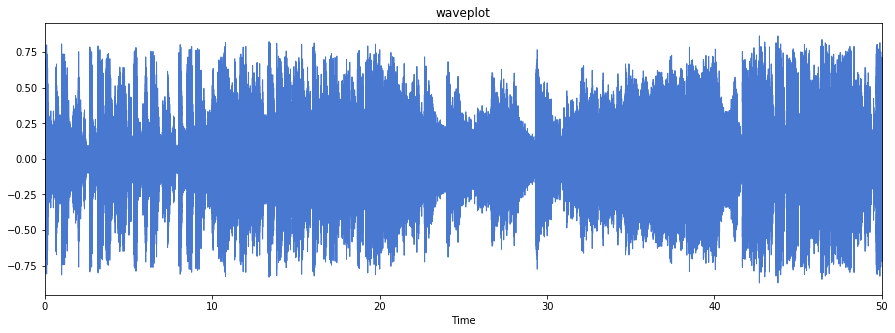

In [130]:
plt.figure(figsize=(15,5))
plt.title("waveplot")

librosa.display.waveplot(y,sr, step = "mid")

Mel Spectrogram

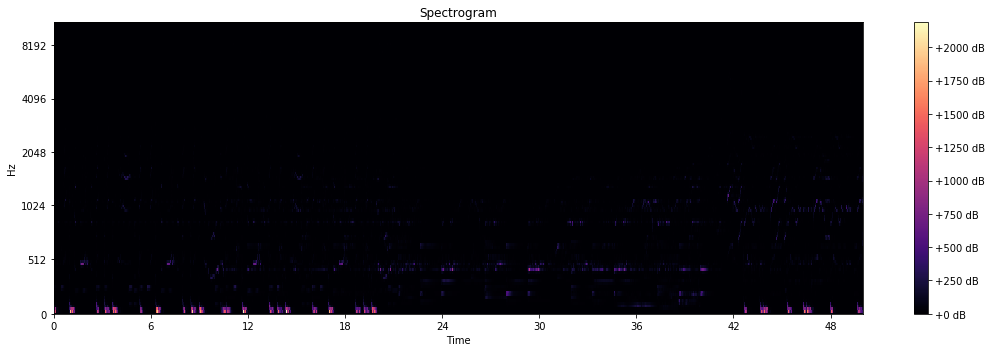

In [141]:
#create mel-scaled power spectrogram
s = librosa.feature.melspectrogram(y, sr = sr, n_mels = 128)

#plot
plt.figure(figsize=(15,5))
plt.title("Spectrogram")

#display spectrogram on mel scale
librosa.display.specshow(s, x_axis = "time", y_axis = "mel")

plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

Closer look at the bottom of the spectrum (use log scale)

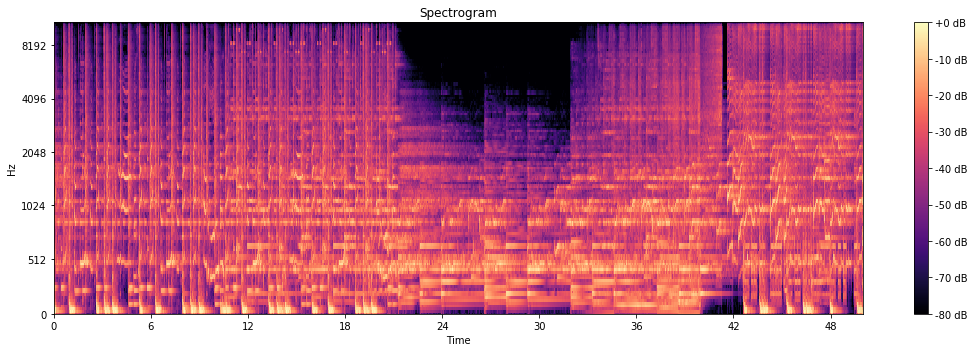

In [142]:
#convert to log scale (dB), use peak power (max) as ref
log_s = librosa.power_to_db(s, ref=np.max)

#plot
plt.figure(figsize=(15,5))
plt.title("Spectrogram")

#display spectrogram on mel scale
librosa.display.specshow(log_s, x_axis = "time", y_axis = "mel")

plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

Harmonic-percussive Separation

In [219]:
y_harm, y_perc = librosa.effects.hpss(y, margin = (1.0, 5.0))

Exception ignored in: <bound method Wave_write.__del__ of <wave.Wave_write object at 0x000000006DEBC588>>
Traceback (most recent call last):
  File "C:\Users\chenjf\Anaconda3\lib\wave.py", line 316, in __del__
    self.close()
  File "C:\Users\chenjf\Anaconda3\lib\wave.py", line 434, in close
    self._ensure_header_written(0)
  File "C:\Users\chenjf\Anaconda3\lib\wave.py", line 454, in _ensure_header_written
    raise Error('sample width not specified')
wave.Error: sample width not specified


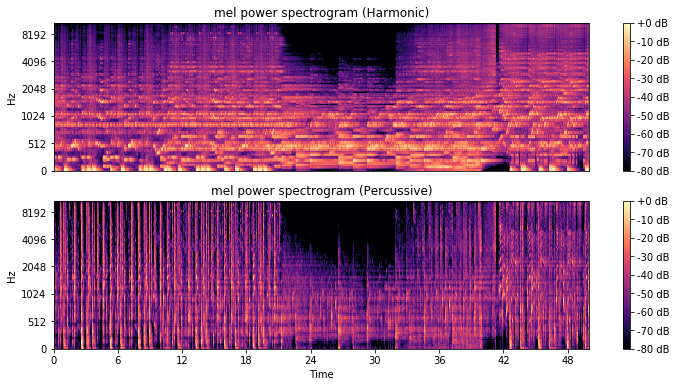

In [220]:
s_harm   = librosa.feature.melspectrogram(y_harm, sr=sr)
s_perc = librosa.feature.melspectrogram(y_perc, sr=sr)

log_sh = librosa.power_to_db(s_harm, ref=np.max)
log_sp = librosa.power_to_db(s_perc, ref=np.max)

plt.figure(figsize=(12,6))

plt.subplot(2,1,1)

# Display the spectrogram on a mel scale
librosa.display.specshow(log_sh, sr=sr, y_axis='mel')

# Put a descriptive title on the plot
plt.title('mel power spectrogram (Harmonic)')

# draw a color bar
plt.colorbar(format='%+02.0f dB')

plt.subplot(2,1,2)
librosa.display.specshow(log_sp, sr=sr, x_axis='time', y_axis='mel')

# Put a descriptive title on the plot
plt.title('mel power spectrogram (Percussive)')

# draw a color bar
plt.colorbar(format='%+02.0f dB')



In [221]:
ipd.Audio(data = y_perc, rate=sr)

In [222]:
ipd.Audio(data = y_harm, rate=sr)

Beat Tracking

<Figure size 864x432 with 0 Axes>

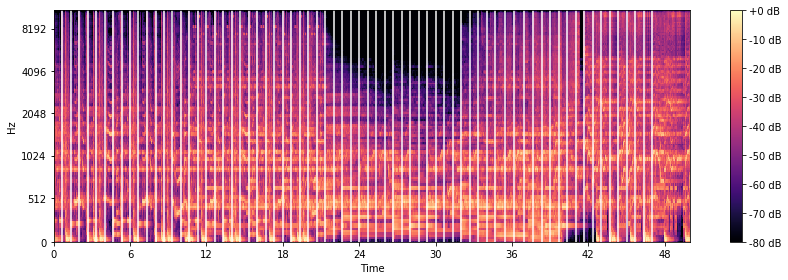

In [111]:
plt.figure(figsize=(12, 6))
#use percussive
tempo, beats = librosa.beat.beat_track(y=y_perc, sr=sr)

# Let's re-draw the spectrogram, but this time, overlay the detected beats
plt.figure(figsize=(12,4))
librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')


# Let's draw transparent lines over the beat frames
plt.vlines(librosa.frames_to_time(beats),
           0, 0.5 * sr,
           colors='w', linestyles="solid", linewidth=2, alpha=0.75)

plt.axis('tight')

plt.colorbar(format='%+02.0f dB')

plt.tight_layout()

In [119]:
print("%.2f" %tempo + " BPM")

89.10 BPM


In [201]:
#metronome

beat_times = librosa.frames_to_time(beats)
y_click = mir_eval.sonify.clicks(beat_times, sr, length=len(y))

ipd.Audio(data=y + y_click, rate=sr)

C:\Users\chenjf\Anaconda3\lib\site-packages\librosa\core\spectrum.py:865: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  warnings.warn('power_to_db was called on complex input so phase '


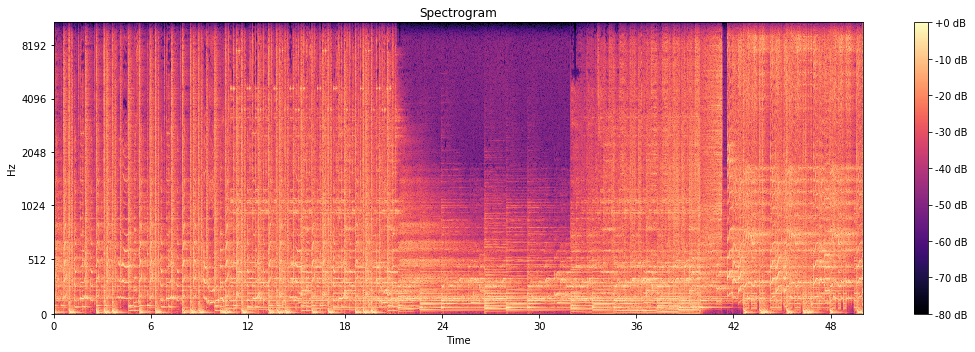

In [143]:
#short time fourier transform
d = librosa.stft(y)

#convert to log scale (dB), use peak power (max) as ref
log_d = librosa.power_to_db(d, ref=np.max)

#plot
plt.figure(figsize=(15,5))
plt.title("Spectrogram")

#display spectrogram on mel scale
librosa.display.specshow(log_d, x_axis = "time", y_axis = "mel")

plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

C:\Users\chenjf\Anaconda3\lib\site-packages\librosa\core\spectrum.py:865: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  warnings.warn('power_to_db was called on complex input so phase '


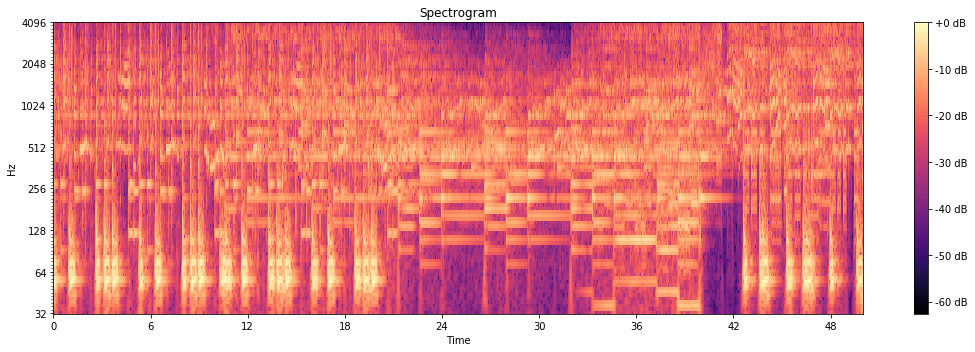

In [149]:
#CQT measures energy in each pitch

#constant-q transform
q = librosa.cqt(y)

#convert to log scale (dB), use peak power (max) as ref
log_q = librosa.power_to_db(q, ref=np.max)

#plot
plt.figure(figsize=(15,5))
plt.title("Spectrogram")

#display spectrogram on mel scale
librosa.display.specshow(log_q, x_axis = "time", y_axis = "cqt_hz")

plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

C:\Users\chenjf\Anaconda3\lib\site-packages\librosa\core\spectrum.py:960: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


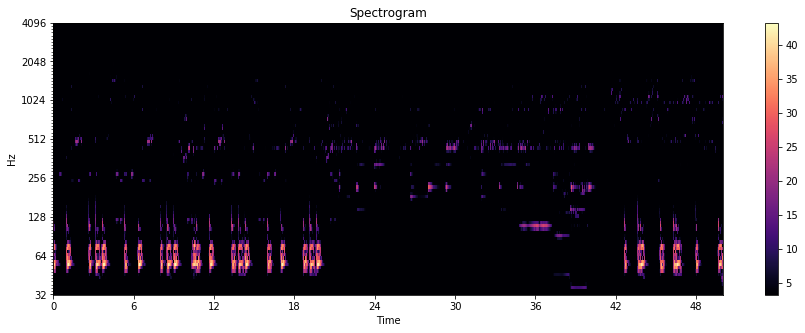

In [164]:
#amplitude to db -> more sparse 
#plot
plt.figure(figsize=(15,5))
plt.title("Spectrogram")



librosa.display.specshow(librosa.amplitude_to_db(q**2, top_db = 40), x_axis = 'time', 
                         y_axis = 'cqt_hz')

plt.colorbar()

Chromagram

Chroma = quality of a pitch

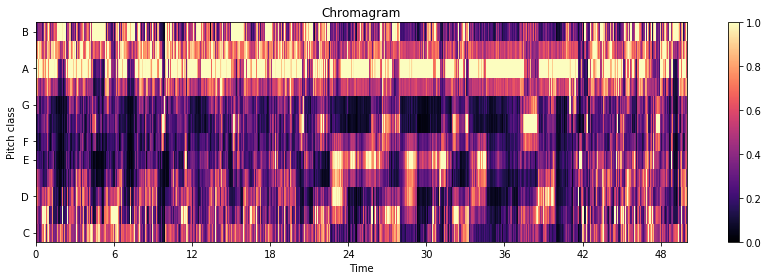

In [167]:
#constant-q transform
C = librosa.feature.chroma_cqt(y=y_harm, sr=sr)

# Make a new figure
plt.figure(figsize=(12,4))

# Display the chromagram: the energy in each chromatic pitch class as a function of time
# To make sure that the colors span the full range of chroma values, set vmin and vmax
librosa.display.specshow(C, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

plt.title('Chromagram')
plt.colorbar()

plt.tight_layout()

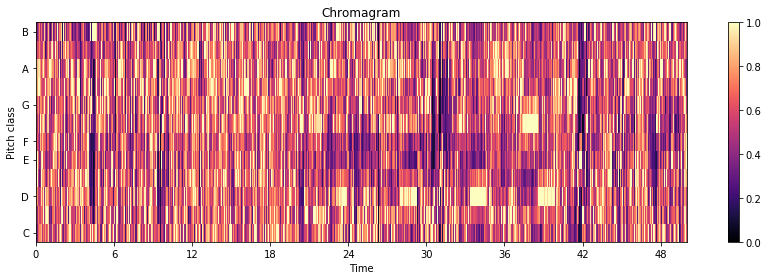

In [168]:
#constant-q transform
C = librosa.feature.chroma_cqt(y=y_perc, sr=sr)

# Make a new figure
plt.figure(figsize=(12,4))

# Display the chromagram: the energy in each chromatic pitch class as a function of time
# To make sure that the colors span the full range of chroma values, set vmin and vmax
librosa.display.specshow(C, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

plt.title('Chromagram')
plt.colorbar()

plt.tight_layout()

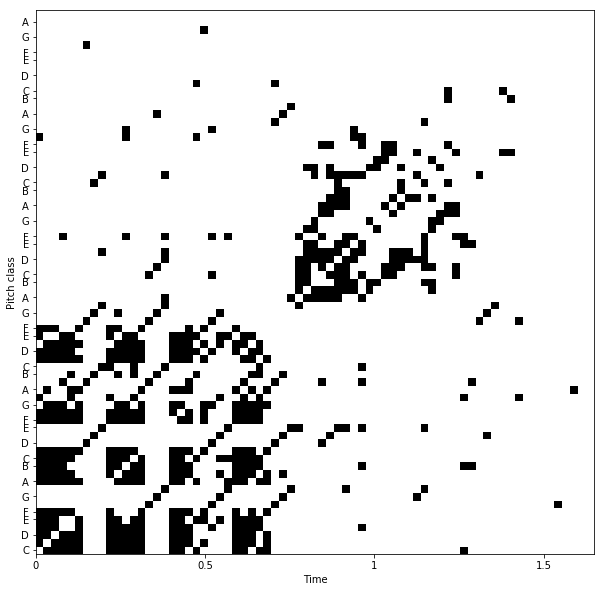

In [217]:
c_sync = librosa.util.sync(C, beats, aggregate=np.mean)

chroma_stack = librosa.feature.stack_memory(c_sync, n_steps=3, mode='edge')

r = librosa.segment.recurrence_matrix(chroma_stack, sym=True)

plt.figure(figsize=(10, 10))
librosa.display.specshow(r, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)